In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os

In [2]:
croads = np.genfromtxt('recordings/croads.csv', delimiter=',')

In [169]:
croads

array([[ 75.,  69.,  45., ...,  70.,  46.,  30.],
       [ 43.,  42., 117., ...,  90., 167., 187.],
       [ 39.,  40.,  82., ...,  65.,  56.,  26.],
       ...,
       [ 38.,  37.,  55., ...,  48., 110.,  79.],
       [ 60.,  54.,  43., ...,  33.,  89.,  49.],
       [ 23.,  31.,  75., ...,  36.,  60.,  45.]])

In [3]:
def get_snippets(data, length, pre_length, threshold):
    """Attempts to align audio samples in data.
    
    Args:
        data (np.ndarray): Matrix where each row corresponds to a recording's audio samples.
        length (int): The length of each aligned audio snippet.
        pre_length (int): The number of samples to include before the threshold is first crossed.
        threshold (float): Used to find the start of the speech command. The speech command begins where the
            magnitude of the audio sample is greater than (threshold * max(samples)).
    
    Returns:
        Matrix of aligned recordings.
    """
    assert isinstance(data, np.ndarray) and len(data.shape) == 2, "'data' must be a 2D matrix"
    assert isinstance(length, int) and length > 0, "'length' of snippet must be an integer greater than 0"
    assert 0 <= threshold <= 1, "'threshold' must be between 0 and 1"
    snippets = []

    # Iterate over the rows in data
    for recording in data:
        # Find the threshold
        recording_threshold = threshold * np.max(recording)

        # Figure out when interesting snippet starts
        i = pre_length
        while recording[i] < recording_threshold:
            i += 1
            
        snippet_start = min(i - pre_length, len(recording) - length)
        snippet = recording[snippet_start:snippet_start + length]

        # Normalization
        snippet = snippet / np.sum(snippet)
        
        snippets.append(snippet)

    return np.vstack(snippets)

# Wrapper function for get_snippets
def process_data(dict_raw, length, pre_length, threshold, plot=True):
    """
    Process the raw data given parameters and return it.
    
    Args:
        dict_raw (np.ndarray): Raw data collected.
        data (np.ndarray): Matrix where each row corresponds to a recording's audio samples.
        length (int): The length of each aligned audio snippet.
        pre_length (int): The number of samples to include before the threshold is first crossed.
        threshold (float): Used to find the start of the speech command. The speech command begins where the
            magnitude of the audio sample is greater than (threshold * max(samples)).
        plot (boolean): Plot the dataset if true.
            
    Returns:
        Processed data dictionary.
    """
    processed_dict = {}
    word_number = 0
    for key, word_raw in dict_raw.items():
        word_processed = get_snippets(word_raw, length, pre_length, threshold)
        processed_dict[key] = word_processed
        if plot:
            plt.plot(word_processed.T)
            plt.title('Samples for "{}"'.format(selected_words_arr[word_number]))
            word_number += 1
            plt.show()
            
    return processed_dict 

recordings/the_den.csv
(40, 172)
recordings/croads.csv
(40, 172)
recordings/den.csv
(40, 172)
recordings/pork_croadobo.csv
(40, 172)
recordings/gbc.csv
(40, 172)
recordings/petes.csv
(40, 172)
recordings/oski.csv
(40, 172)
recordings/clark_kerr_dining.csv
(40, 172)
recordings/foothill.csv
(40, 172)
recordings/peetes.csv
(40, 172)


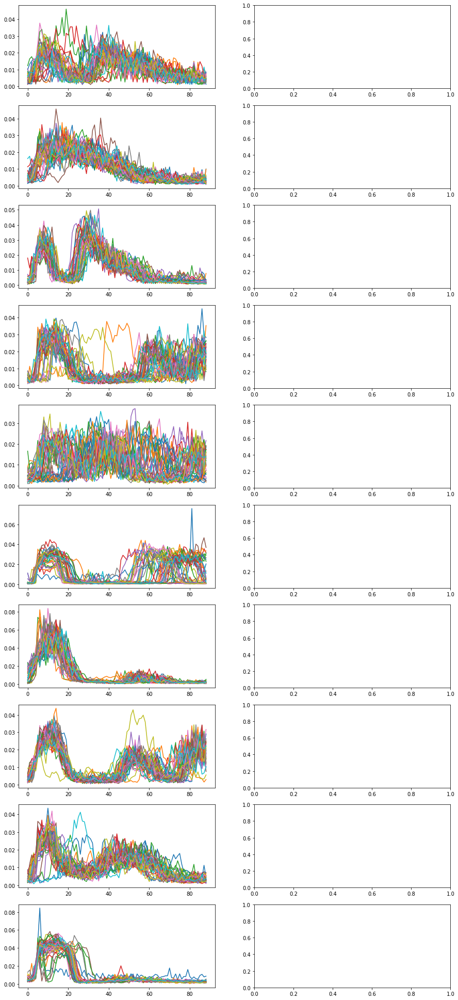

In [21]:
fig = plt.figure(figsize=(15, 35))
ax = fig.subplots(10, 2)

length = 89 # Default: 80
pre_length = 5 # Default: 5
threshold = 0.5 # Default: 0.5



for i, file in enumerate(os.listdir('recordings')):
    print('recordings/' + file)
    recordings = np.genfromtxt('recordings/' + file, delimiter=',')
    if recordings.shape[1] < 39:
        continue
    avg = np.mean(recordings, axis=0)
    vars = np.var(recordings, axis=0)
    k = 100
    while np.sum(np.all((recordings < avg+ k*np.sqrt(vars)), axis=1)) >= 40:
        k-=1
    bounded = recordings[np.all((recordings < avg+ (k+1)*np.sqrt(vars)), axis=1)]
    bounded = pd.DataFrame(bounded, index=None)
    bounded['sharpness'] = bounded.apply(lambda s: calc_sharpness(s, 10), axis=1)    
    smoothest = bounded.nsmallest(40, 'sharpness')
    
    smoothest = smoothest.drop(['sharpness'], axis=1)
    smoothest.to_csv('outputs/' + str(file), header=None)
    print(smoothest.to_numpy().shape)
    ax[i, 0].plot(get_snippets(smoothest.to_numpy(), length, pre_length, threshold).T)
    # ax[i, 0].plot(smoothest.T)
    # ax[i, 0].plot(np.sqrt(vars))
    # ax[i, 0].plot(avg)
    # ax[i, 1].plot(recordings.T)

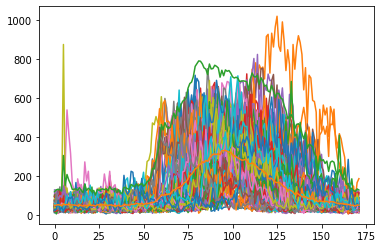

In [5]:
avg = np.mean(croads, axis=0)
vars = np.var(croads, axis=0)
plt.plot(croads.T)
plt.plot(avg)
plt.plot(avg+3*np.sqrt(vars))
#plt.plot(avg-vars/50)
#plt.plot(vars/(100))

In [6]:
bounded = croads[np.all((croads < avg+ 3*np.sqrt(vars)), axis=1)]

In [7]:
bounded.shape

(66, 172)

In [9]:
bounded = pd.DataFrame(bounded, index=None)

In [10]:
bounded['sharpness'] = bounded.apply(lambda s: calc_sharpness(s, 10), axis=1)    
smoothest = bounded.nsmallest(40, 'sharpness')
smoothest = smoothest.drop(['sharpness'], axis=1).iloc[:,1:]

NameError: name 'calc_sharpness' is not defined

In [11]:
plt.plot(smoothest.T)

NameError: name 'smoothest' is not defined

In [12]:
def make_filter(size, mu, sigma):
    return np.array([(2.*np.pi*sigma**2. )**-.5 * np.exp( -.5 * (x-mu)**2. / sigma**2. ) for x in range(size)])

In [13]:
croads = pd.read_csv('outputs/croads.csv', header=None)
croads.iloc[:, 1:].shape

(40, 172)

In [206]:
normalized = croads.div(croads.max(axis=1), axis=0)

In [5]:
maxes = croads.max(axis=1)
maxes.shape

(110,)

In [152]:
def calc_entropy(s):
    _, counts = np.unique(s, return_counts=True)
    p = counts / len(s)
    return -np.sum(p * np.log(p))


croads['vars'] = croads.apply(np.var, axis=1)
croads['entropy'] = croads.apply(calc_entropy, axis=1)

In [14]:
def calc_sharpness(s, sigma):
    lowpass = make_filter(sigma*4+1, 0, sigma)
    error = s - np.convolve(s, lowpass, 'same') 
    return np.sqrt(np.sum(np.square(error))/len(s))

In [10]:
croads['sharpness'] = croads.apply(lambda s: calc_sharpness(s, 10), axis=1)

In [12]:
smoothest = croads.nsmallest(40, 'sharpness')

In [207]:
def make_filter(size, mu, sigma):
    return np.array([(2.*np.pi*sigma**2. )**-.5 * np.exp( -.5 * (x-mu)**2. / sigma**2. ) for x in range(size)])

def calc_sharpness(s, sigma):
    lowpass = make_filter(sigma*4+1, 0, sigma)
    error = s - np.convolve(s, lowpass, 'same') 
    return np.sqrt(np.sum(np.square(error))/len(s))

recordings/the_den.csv
(40, 172)
recordings/croads.csv
(40, 172)
recordings/den.csv
(40, 172)
recordings/pork_croadobo.csv
(40, 172)
recordings/gbc.csv
(40, 172)
recordings/petes.csv
(40, 172)
recordings/clark_kerr_dining.csv
(40, 172)
recordings/foothill.csv
(40, 172)


IndexError: index 7 is out of bounds for axis 0 with size 7

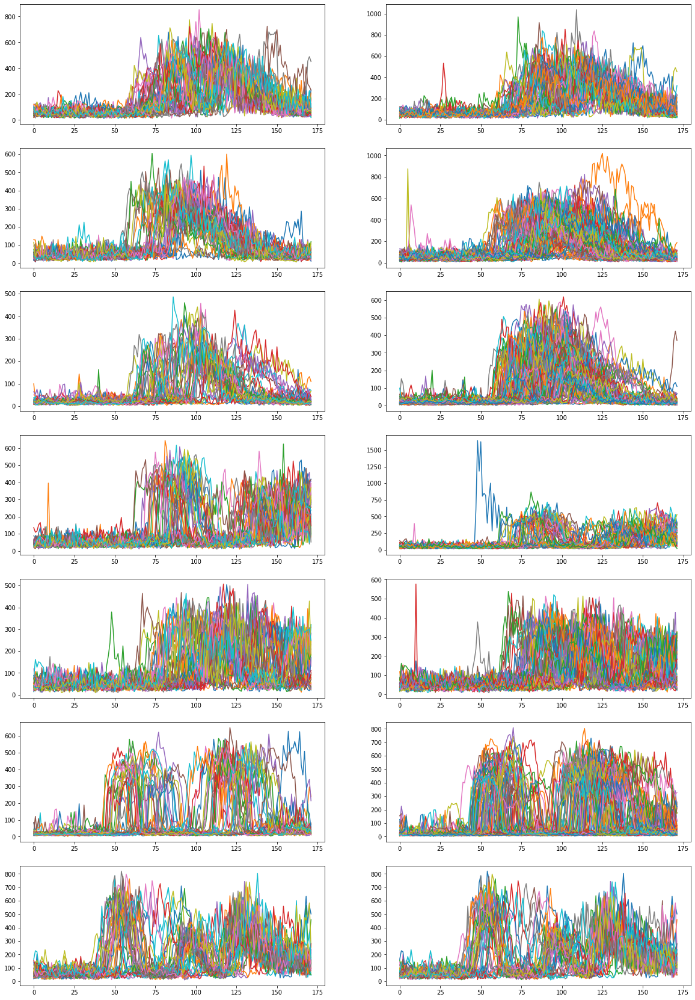

In [15]:
fig = plt.figure(figsize=(20, 30))
ax = fig.subplots(7, 2)

for i, file in enumerate(os.listdir('recordings')):
    print('recordings/' + file)
    recordings = pd.read_csv('recordings/' + file, header=None)
    if recordings.shape[1] < 39:
        continue
    recordings['sharpness'] = recordings.apply(lambda s: calc_sharpness(s, 10), axis=1)    
    smoothest = recordings.nsmallest(40, 'sharpness')
    
    smoothest = smoothest.drop(['sharpness'], axis=1)
    smoothest.iloc[:, 1:].to_csv('outputs/' + str(file), header=None)
    print(smoothest.shape)
    ax[i, 0].plot(smoothest.T)
    ax[i, 1].plot(recordings.iloc[:, :-1].T)


foothill.csv
(40, 172) (55, 172)


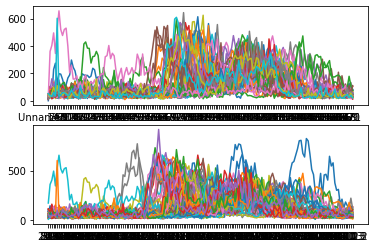

In [162]:
print(files[i])
best = pd.read_csv('outputs/' + files[i])
all = pd.read_csv('recordings/' + files[i])
fig, ax = plt.subplots(2)
ax[0].plot(best.T)
ax[1].plot(all.T)
print(best.shape, all.shape)
i = (i+1) % (len(files)-1)

In [60]:
smoothest.columns[:3]

Index(['65.0', '52.0', '41.0'], dtype='object')

In [166]:
out = pd.read_csv('outputs/foothill.csv')

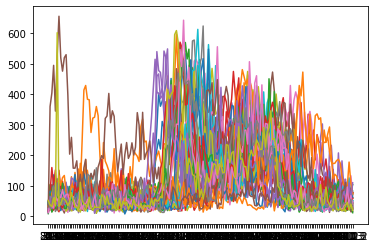

In [167]:
plt.plot(out.T)

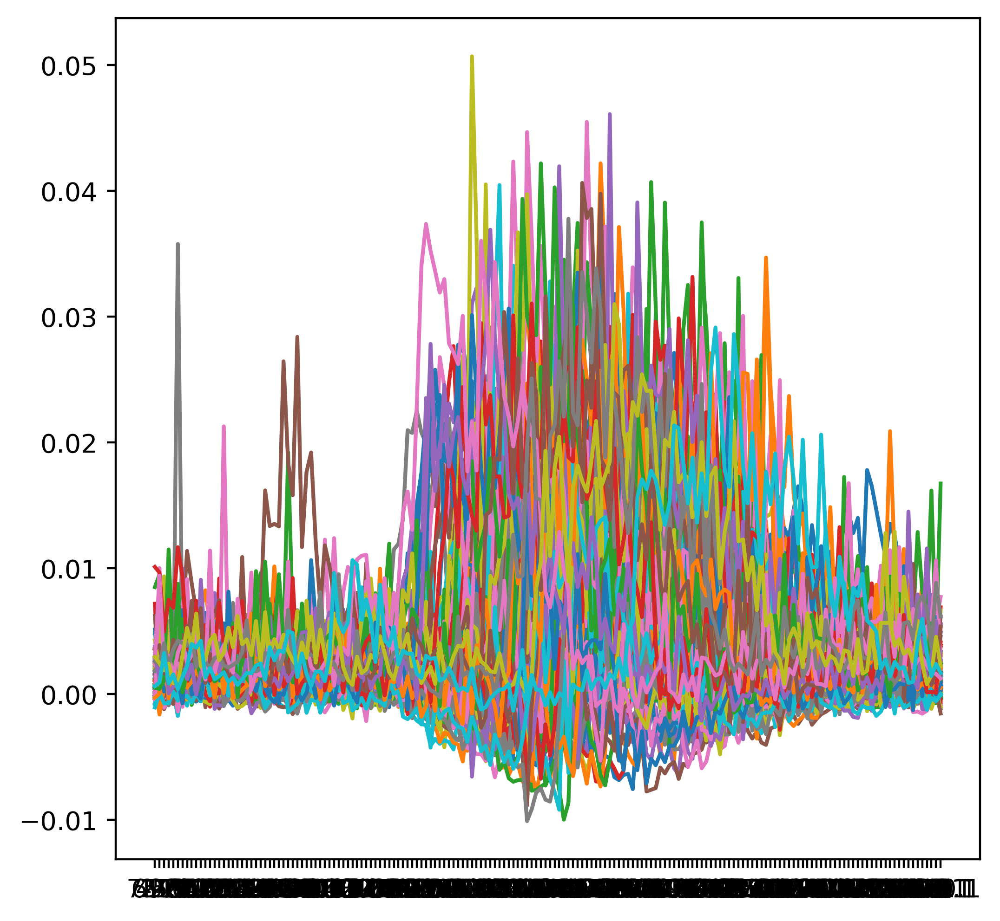

In [231]:
ks = 10
lp = make_filter(1+2*ks, 0, ks)
smoothed = normalized.iloc[:, :172].apply(lambda s: np.convolve(s, lp, 'same'))
plt.plot(normalized.iloc[:,:172].T-smoothed.T)

In [235]:
least_var = croads.nsmallest(40, 'vars')
least_entropy = croads.nsmallest(40, 'entropy')
least_sharpness = normalized.nsmallest(40, 'sharpness')

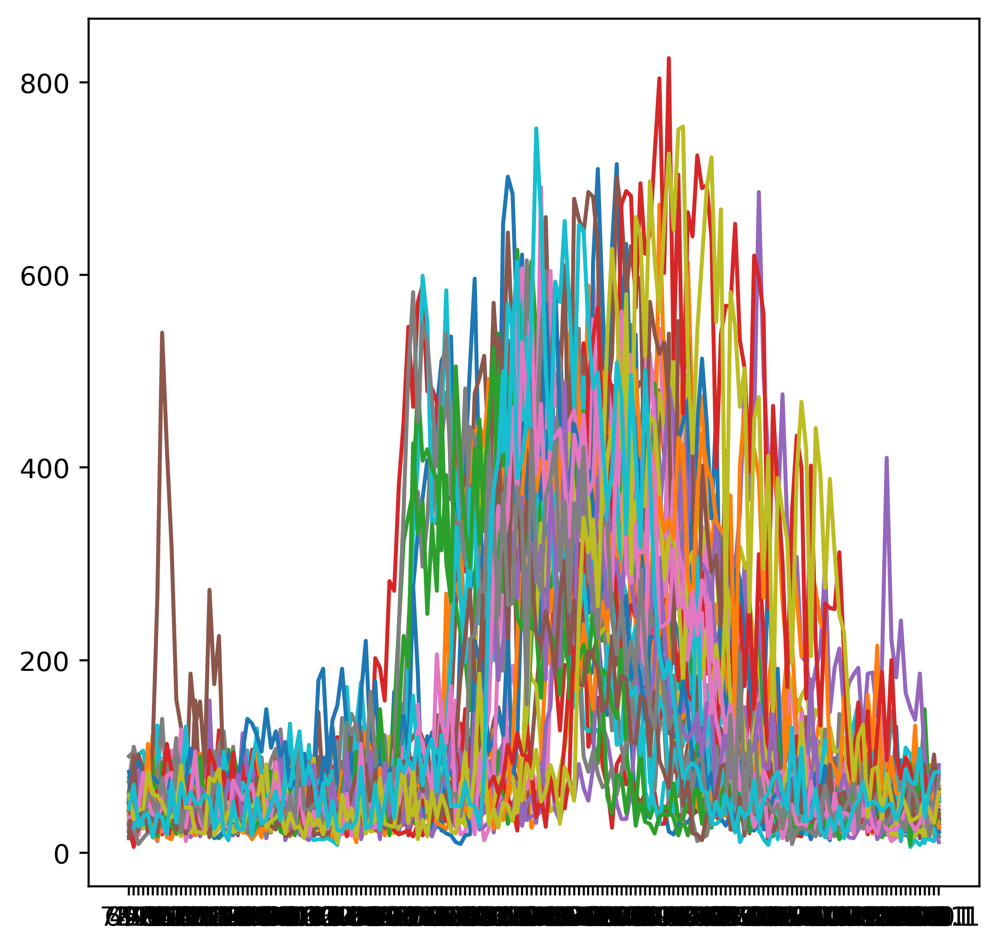

In [182]:
plt.rcParams['figure.figsize']=(6,6)
plt.plot(croads.sample(40).iloc[:, :-2].T)

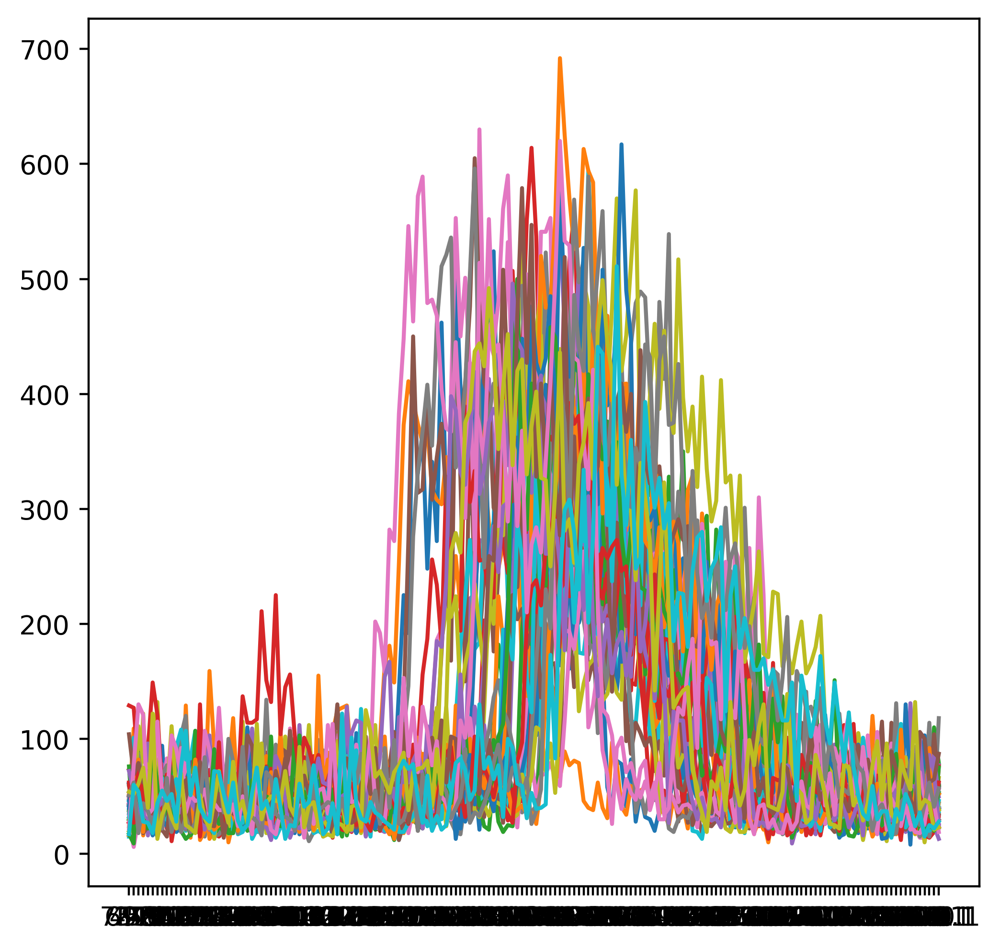

In [180]:
plt.plot(least_entropy.iloc[:, :-2].T)

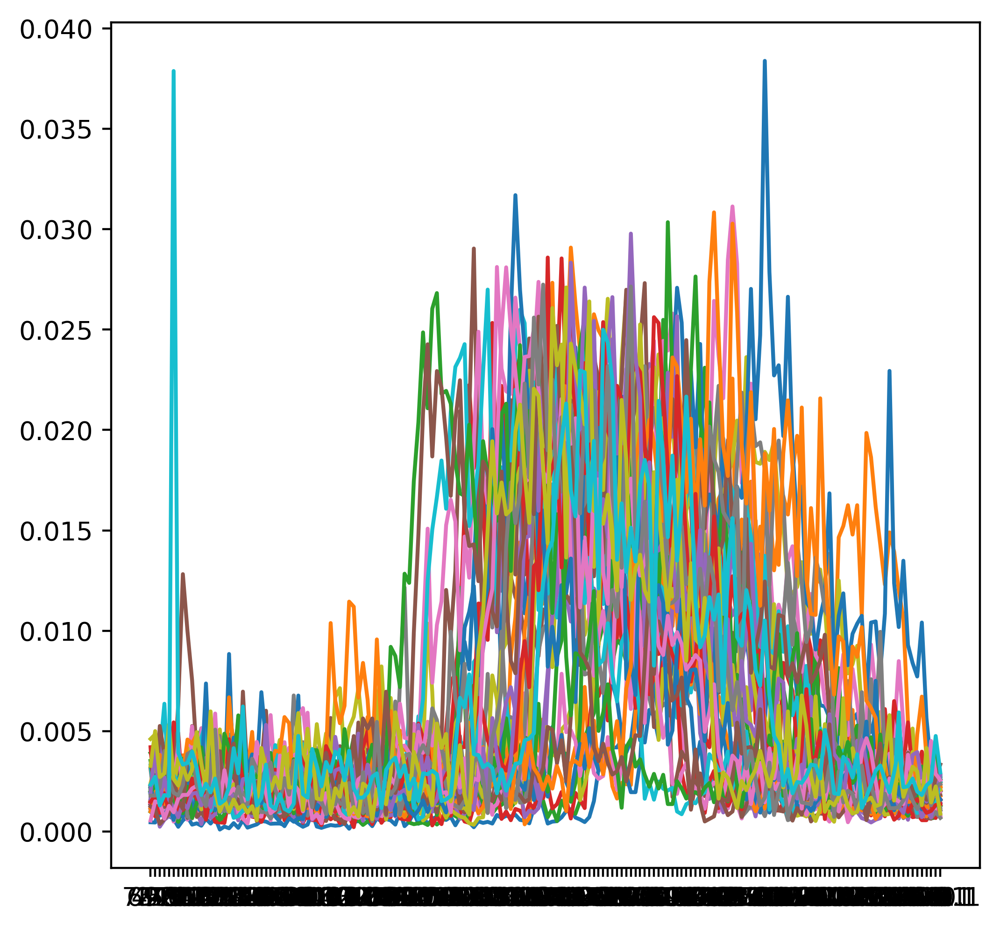

In [236]:
plt.plot(least_sharpness.iloc[:, :172].T)

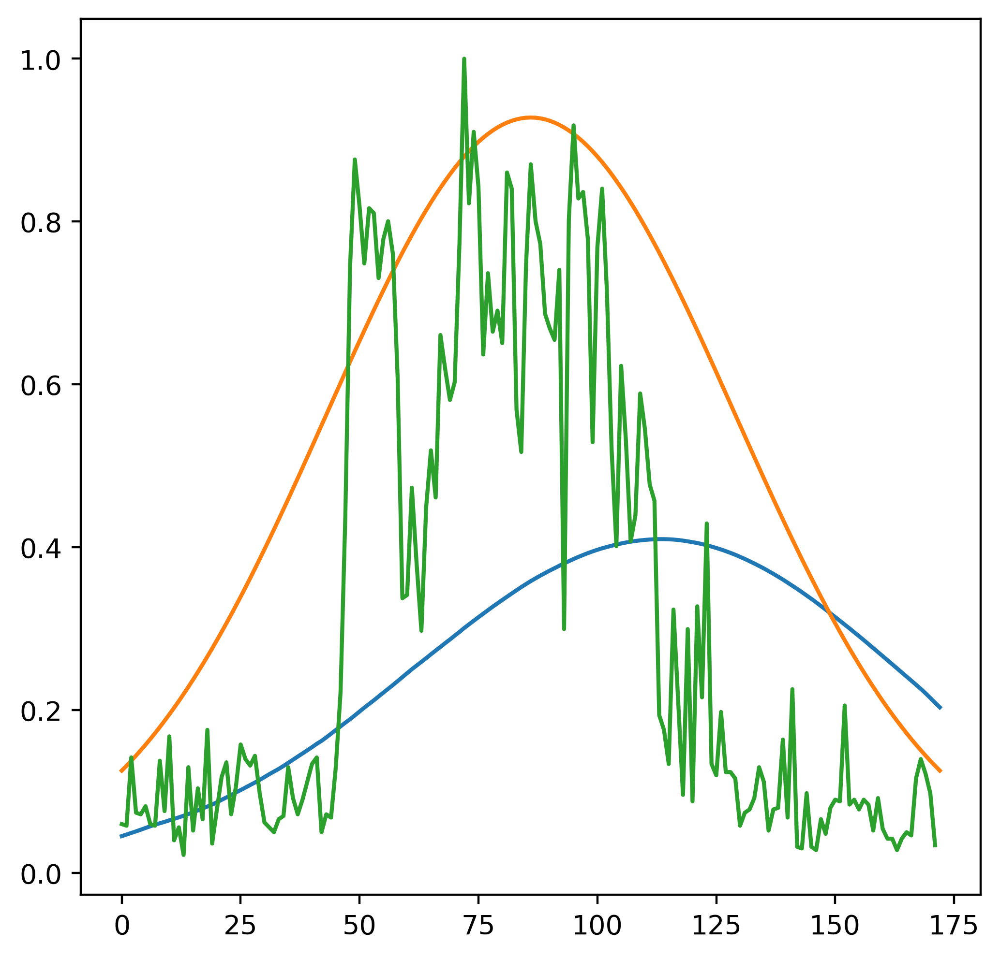

In [205]:
plt.plot(np.correlate(test_sig, fltr, 'same'))
plt.plot(fltr*100)
plt.plot(np.roll(test_sig, -110+75))

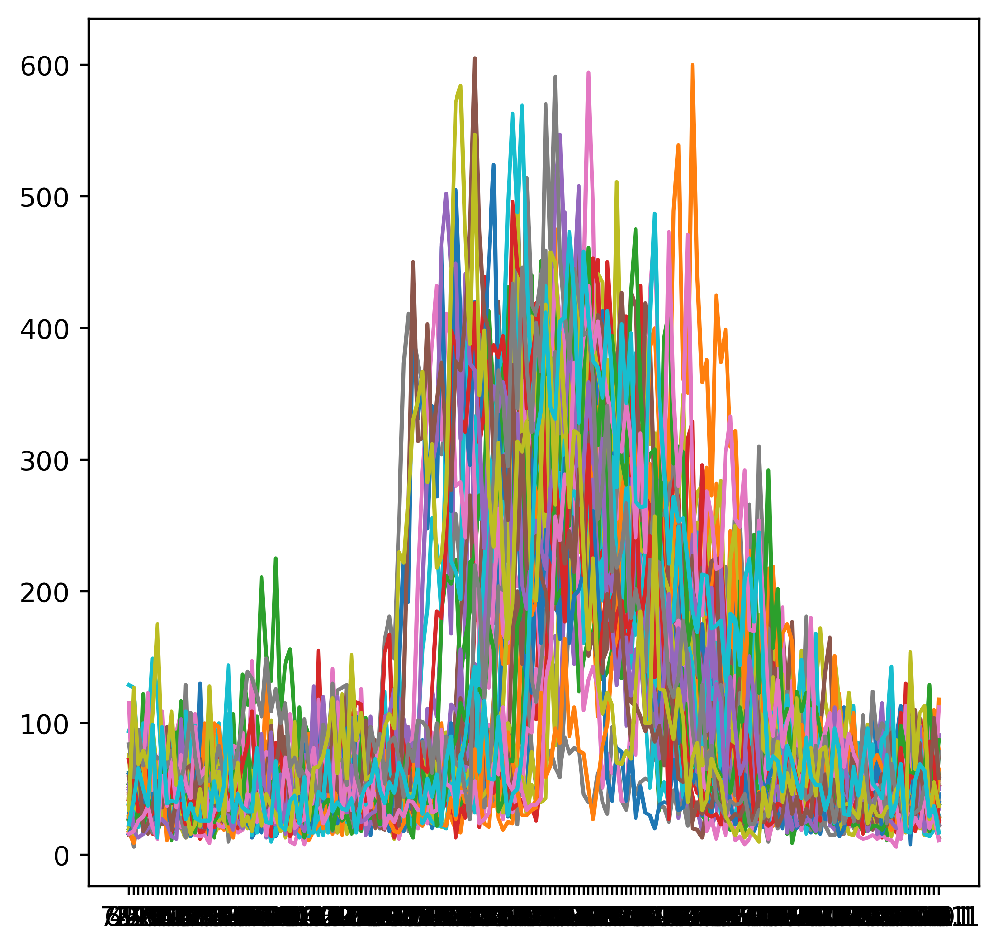

In [181]:
plt.plot(least_var.iloc[:, :-2].T)

In [6]:
normalized = croads.div(croads.max(axis=1), axis=0)

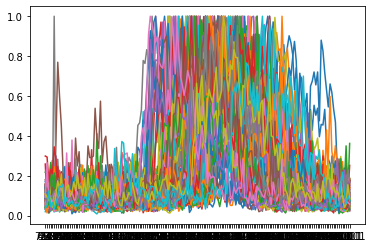

In [7]:
plt.plot(normalized.T)

In [8]:
avg = normalized.mean(axis=0)

In [192]:
ksize=173//2
mu, sigma = 0, ksize//2 
fltr = np.array([(2.*np.pi*sigma**2. )**-.5 * np.exp( -.5 * (x-mu)**2. / sigma**2. ) for x in range(-ksize, ksize+1)])

In [10]:
def smooth(signal, kernel):
    padded = np.pad(signal, (len(kernel)//2, len(kernel)//2))
    return np.correlate(signal, kernel)

In [11]:
normalized['fitness']=normalized.apply(lambda s: max(np.correlate(s, avg, 'full')), axis=1)

In [12]:
normalized['shift']=normalized.apply(lambda s: np.argmax(np.correlate(s, avg, 'full')), axis=1)

In [13]:
top_40 = normalized.nlargest(40, 'fitness')

In [14]:
best_signals = top_40.iloc[:, :172].reset_index(drop=True)

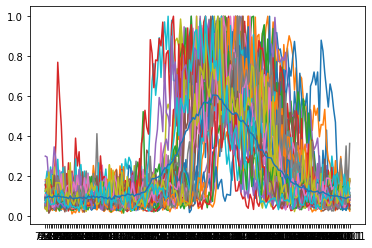

In [15]:
plt.plot(best_signals.T)
plt.plot(avg)

In [16]:
shifts = top_40['shift'].reset_index(drop=True)

In [17]:
shifts[39]

172

In [18]:
offset=-80
shifted = pd.DataFrame([np.roll(best_signals.iloc[i], offset+shifts[i]) for i in range(40)])

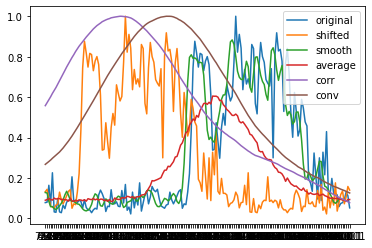

In [110]:
plt.plot(best_signals.iloc[0])
plt.plot(shifted.iloc[0])
plt.plot(smooth(best_signals.iloc[0], fltr))
plt.plot(avg)
plt.plot(np.correlate(shifted.iloc[0], avg, 'same')/max(np.correlate(shifted.iloc[0], avg, 'same')))
plt.plot(np.convolve(shifted.iloc[0], avg, 'same')/max(np.convolve(shifted.iloc[0], avg, 'same')))
plt.legend(['original', 'shifted', 'smooth', 'average', 'corr', 'conv'])

In [20]:
max(np.correlate(best_signals.iloc[0], avg, 'full')), max(np.correlate(shifted.iloc[0], avg, 'full'))

(20.006153361289133, 19.826053099309746)

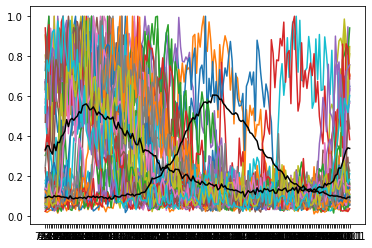

In [21]:
plt.plot(shifted.T)
plt.plot(shifted.mean(axis=0), c='black')
plt.plot(avg, c='black')

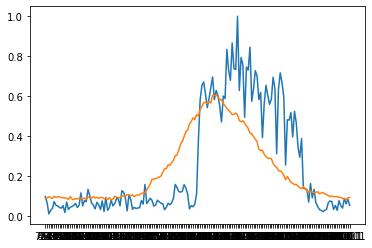

In [22]:
plt.plot(best_signals.iloc[15])
plt.plot(avg)


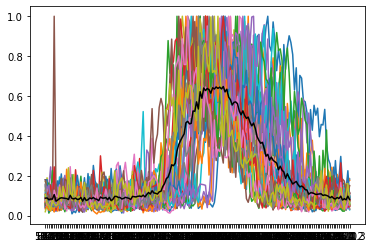

In [23]:
fucked = pd.read_csv('butchered.csv')
fucked = fucked.div(fucked.max(axis=1), axis=0)
bruh = fucked.mean(axis=0)
plt.plot(fucked.T)
plt.plot(bruh, c='black')


In [43]:
test_sig = best_signals.iloc[0].to_numpy()

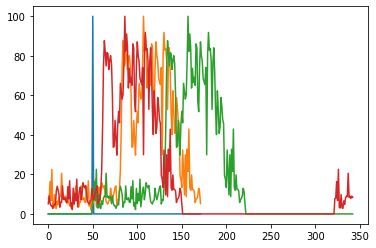

In [103]:
ddelt = np.zeros(172)
ddelt[0] = 100
ddelt = np.roll(ddelt, 50)
plt.plot(ddelt)
plt.plot(100*test_sig)
conv = np.convolve(ddelt, test_sig, 'full')
shift = np.argmax(conv)
plt.plot(np.roll(conv, 0))
plt.plot(np.roll(conv, -shift+173//2))

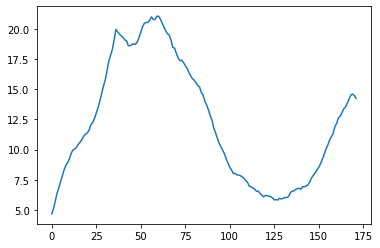

In [109]:
plt.plot(np.roll(np.correlate(test_sig, np.roll(test_sig, 50), 'same'), 0//2))


In [37]:
smoothed = np.array([np.correlate(s, np.ones(9)/9, 'same') for s in best_signals.to_numpy()])
smooth_shifts = np.apply_along_axis(lambda s: np.roll(s, -np.argmax(np.correlate(s, avg, 'same'))), 1, smoothed)

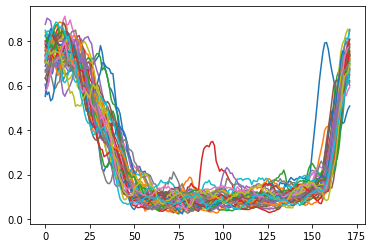

In [38]:
plt.plot(smooth_shifts.T)